In [1]:
# if you are in folder experiments, uncomment and run this ones

In [1]:
%cd ..

/home/g/GitHub/annealed


In [2]:
import os
import torch
device = 'cuda' if torch.cuda.is_available() else 'cpu'
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False
if IN_COLAB:
    print('we are in colab')
    !python -m pip install --upgrade -q git+https://github.com/alexey-pronkin/annealed@master
else:
    print('we are not in colab')
    !python -m pip uninstall avo -y
    !python 'setup.py' install

we are not in colab
/home/g/miniconda3/envs/annealed/lib/python3.7/distutils/dist.py:274: UserWarning: Unknown distribution option: 'install_requires'
  warnings.warn(msg)
running install
running build
running build_py
running install_lib
creating /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo
creating /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
copying build/lib/avo/models/vae_decoder.py -> /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
copying build/lib/avo/models/vae_gaussian.py -> /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
copying build/lib/avo/models/nflows.py -> /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
copying build/lib/avo/models/hvi.py -> /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
copying build/lib/avo/models/hvi_transition.py -> /home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/avo/models
copying build/lib/av

In [3]:
import avo

In [4]:
if IN_COLAB:
    %load_ext tensorboard
    %tensorboard --logdir lightning_logs
else:
    %load_ext tensorboard
    %tensorboard --logdir lightning_logs

Reusing TensorBoard on port 6007 (pid 34880), started 1:05:39 ago. (Use '!kill 34880' to kill it.)

In [5]:
from avo.toy_dist import targets as toy_targets
from avo.toy_dist import anntargets

In [6]:
from avo.toy_dist import PickleRick, ThreeMixture, SimpleNormal, MixtureTarget, DFunction

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from collections import OrderedDict
device = 'cuda' if torch.cuda.is_available() else 'cpu'

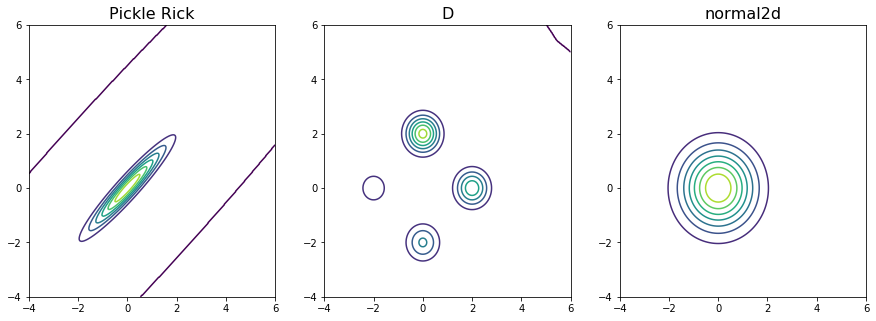

In [8]:
target_names = ['pickle2d', 'mixture2d', 'normal2d']
fig, ax = plt.subplots(ncols=len(target_names), figsize= (15,5))
targets = OrderedDict()

for i, t_name in enumerate(target_names):
    if t_name == 'pickle2d':
        L_target = torch.cholesky(torch.Tensor([[1., 0.95], [0.95, 1.]]))
        target = PickleRick(torch.Tensor([0., 0.]).unsqueeze(0).to(device), L_target.to(device)) 
    elif t_name == 'mixture2d':
        target = DFunction(device)
    elif t_name == 'normal2d':
        target = SimpleNormal(device)
    target.plot2d_pdf(ax[i], bounds=((-4, 6), (-4, 6)))
    targets[t_name] = target

# NF HVI AVO

In [10]:
from avo.models import HVIAVO, HVIELBO, IAFELBO, IAFAVO, HouseholderELBO, HouseholderAVO
import pytorch_lightning as pl
import torch.nn as nn
from itertools import product

In [ ]:
# toy_targets = [
#     MixtureTarget(target1=targets[0], target2=targets[1], alpha = 0.7), 
#     DFunction(device=device)
# ]

In [11]:
models_classes = [
    HVIELBO,
    IAFELBO,
    HouseholderELBO,
    HVIAVO, 
    IAFAVO, 
    HouseholderAVO, 
]

In [12]:
targets

OrderedDict([('pickle2d', <avo.toy_dist.PickleRick at 0x7f0a0c313190>),
             ('mixture2d', <avo.toy_dist.DFunction at 0x7f0a0c385150>),
             ('normal2d', <avo.toy_dist.SimpleNormal at 0x7f0a0c341890>)])

In [13]:
def make_models(targets):
    models = OrderedDict()
    for d_name, d  in targets.items():
        models[d_name +'&'+ HVIELBO.__name__] = HVIELBO(input_dimension=2, depth=4, hidden_dimension=32, target=d, batch_size=128)
        models[d_name +'&'+ IAFELBO.__name__] = IAFELBO(input_dimension=2, depth=3, AR_dimensions=[32, 32], target=d, activation='ReLU', batch_size=128)
    #     models[d_name +'&'+ HouseholderELBO.__name__] = HouseholderELBO(input_dimension=2, batch_size=128, target=d, depth=5)
        models[d_name +'&'+ HVIAVO.__name__] = HVIAVO(input_dimension=2, depth=4, hidden_dimension=32, target=d, batch_size=128)
        models[d_name +'&'+ IAFAVO.__name__] = IAFAVO(input_dimension=2, depth=3, AR_dimensions=[32, 32], target=d, activation='ReLU', batch_size=128)
    #     models[d_name + HouseholderAVO.__name__] = HouseholderAVO(input_dimension=2, batch_size=128, target=d, depth=5)
    return models

In [15]:
def train_evaluate(models):
    traines = {}
    for model_name, model in models.items():
        traines[model_name] = pl.Trainer(max_epochs=2, max_steps = 3000, progress_bar_refresh_rate=10)
        traines[model_name].fit(model, model.data_loader(iteration_count=5000));
    for t, m in zip(traines.items(), models.items()):
        t_name, trainer = t
        model_name, model = m
        trainer.test(model, model.data_loader(500))
    return traines

In [16]:
# z = torch.randn((1, 2), device=device)
# models['mixture2d'].forward(z)
# log_prob = torch.sum(torch.distributions.normal.Normal(0, 1).log_prob(z), dim=1)
# mu, sigma = models['mixture2d']._transitions[0]._alpha
# print(mu)
# print(sigma)
# _, z, log_prob = models['mixture2d']._transitions[1](z, log_prob)
# _, z, log_prob = models['mixture2d']._transitions[2](z, log_prob)
# _, z, log_prob = models['mixture2d']._transitions[3](z, log_prob)
# _, z, log_prob = models['mixture2d']._transitions[4](z, log_prob)

In [66]:
def plot_results(models, targets):
    n_rows = len(models)//len(targets) # 4
    n_cols = len(targets) # 3
    fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(6*n_cols,6*n_rows), dpi= 120)
    target_names = list(targets.keys())
    for i, m in enumerate(models.items()):
        print(i)
        model_name, model = m
        if model_name == 'four-mode mixture of Gaussian as a true target energy':
            model_name = "toy dist d"
        model.to(device)
        sample_points = model.sample(100000).cpu().detach().numpy()
        ax[i%n_rows, i//n_rows].hist2d(sample_points[:, 0], sample_points[:, 1],  bins=(200, 200), cmap=plt.cm.Reds)
        targets[model_name.split('&')[0]].plot2d_pdf(ax[i%n_rows, i//n_rows], bounds=((-4, 6), (-4, 6)))
        ax[i%n_rows, i//n_rows].set_ylabel(model_name.split('&')[1], fontsize=14)
    return fig, ax

In [47]:
def plot_results_t(models, targets):
    n_rows = len(models)//len(targets) # 4
    n_cols = len(targets) # 3
    fig, ax = plt.subplots(nrows=n_cols, ncols=n_rows, figsize=(5*n_cols,5*n_rows))
    target_names = list(targets.keys())
    for i, m in enumerate(models.items()):
        print(i)
        model_name, model = m
        model.to(device)
        sample_points = model.sample(100000).cpu().detach().numpy()
        ax[i//n_rows, i%n_rows].hist2d(sample_points[:, 0], sample_points[:, 1],  bins=(200, 200), cmap=plt.cm.Reds)
        targets[model_name.split('&')[0]].plot2d_pdf(ax[i//n_rows, i%n_rows], bounds=((-4, 6), (-4, 6)))
        ax[i//n_rows, i%n_rows].set_ylabel(model_name.split('&')[1], fontsize=14)
    return fig, ax

In [20]:
models = make_models(targets)
trainers = train_evaluate(models)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9760), 'entropy': tensor(-1.6453), 'loss': tensor(-0.6693)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.0677), 'entropy': tensor(-0.6585), 'loss': tensor(0.4093)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9705), 'entropy': tensor(-1.5687), 'loss': tensor(-0.5982)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.0468), 'entropy': tensor(-1.6750), 'loss': tensor(-0.6281)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.3892), 'entropy': tensor(-1.6047), 'loss': tensor(0.7845)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.9915), 'entropy': tensor(0.5703), 'loss': tensor(3.5618)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.9815), 'entropy': tensor(-2.7587), 'loss': tensor(0.2228)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(4.4181), 'entropy': tensor(-0.5977), 'loss': tensor(3.8204)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9751), 'entropy': tensor(-2.8125), 'loss': tensor(-1.8375)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.0201), 'entropy': tensor(-1.8364), 'loss': tensor(-0.8162)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9566), 'entropy': tensor(-2.7916), 'loss': tensor(-1.8351)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9814), 'entropy': tensor(-2.7810), 'loss': tensor(-1.7996)}
--------------------------------------------------------------------------------



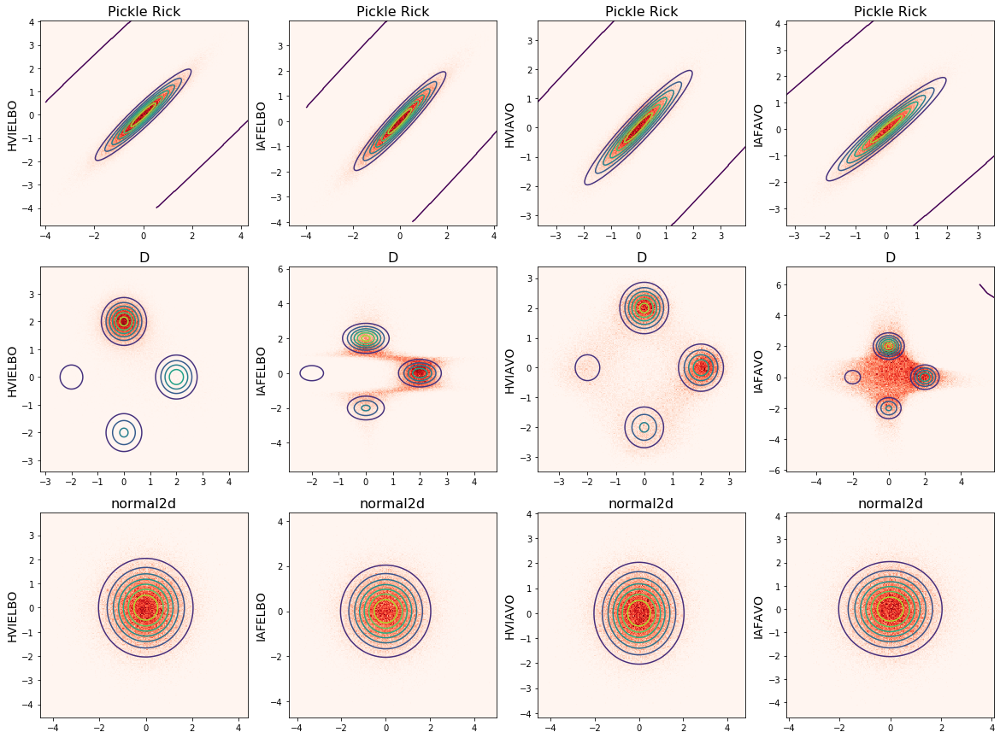

In [36]:
fig, axs = plot_results_t(models, targets)

In [23]:
fig.savefig('nfows_d.png', transparent=True)

In [28]:
toy_targets

In [30]:
targets_toy = {d.name:d for d in toy_targets}

In [31]:
models_toy = make_models(targets_toy)
trainers_toy = train_evaluate(models_toy)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 2 K   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores

  | Name         | Type       | Params
--------------------------------------------
0 | _transitions | ModuleList | 3 K   


--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8562), 'entropy': tensor(-1.9340), 'loss': tensor(-1.0778)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.7016), 'entropy': tensor(-0.1699), 'loss': tensor(2.5317)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8204), 'entropy': tensor(-2.5956), 'loss': tensor(-1.7753)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(4.7675), 'entropy': tensor(-0.6773), 'loss': tensor(4.0902)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.1663), 'entropy': tensor(-4.5868), 'loss': tensor(-3.4204)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.6872), 'entropy': tensor(-3.5943), 'loss': tensor(-2.9071)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9128), 'entropy': tensor(-4.5036), 'loss': tensor(-3.5908)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.2612), 'entropy': tensor(-2.6781), 'loss': tensor(-0.4169)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.7276), 'entropy': tensor(-4.0329), 'loss': tensor(-3.3054)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9799), 'entropy': tensor(-3.0865), 'loss': tensor(-2.1066)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.6396), 'entropy': tensor(-4.0258), 'loss': tensor(-3.3861)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(1.1757), 'entropy': tensor(-3.3751), 'loss': tensor(-2.1994)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.5446), 'entropy': tensor(-2.0866), 'loss': tensor(0.4579)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(2.7260), 'entropy': tensor(0.2918), 'loss': tensor(3.0178)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(3.0434), 'entropy': tensor(-2.8360), 'loss': tensor(0.2074)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(4.2752), 'entropy': tensor(-0.5933), 'loss': tensor(3.6819)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.7747), 'entropy': tensor(-2.3113), 'loss': tensor(-1.5366)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.8482), 'entropy': tensor(-1.5085), 'loss': tensor(-0.6603)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.9012), 'entropy': tensor(-2.0668), 'loss': tensor(-1.1656)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.5871), 'entropy': tensor(-2.0753), 'loss': tensor(-1.4883)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.7980), 'entropy': tensor(-2.2286), 'loss': tensor(-1.4306)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.3801), 'entropy': tensor(-1.6447), 'loss': tensor(-1.2646)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.5086), 'entropy': tensor(-2.1126), 'loss': tensor(-1.6040)}
--------------------------------------------------------------------------------



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'energy': tensor(0.5652), 'entropy': tensor(-2.5236), 'loss': tensor(-1.9584)}
--------------------------------------------------------------------------------



In [56]:
targets_toy

{'toy dist a': <avo.toy_dist.ToyA at 0x7fa38a8513d0>,
 'toy dist b': <avo.toy_dist.ToyB at 0x7fa38a851410>,
 'toy dist c': <avo.toy_dist.ToyC at 0x7fa38a851450>,
 'four-mode mixture of Gaussian as a true target energy': <avo.toy_dist.ToyD at 0x7fa38a8514d0>,
 'toy dist e': <avo.toy_dist.ToyE at 0x7fa38a851510>,
 'toy dist f': <avo.toy_dist.ToyF at 0x7fa38a851550>}

In [55]:
targets_toy['four-mode mixture of Gaussian as a true target energy'].name = "toy dist d"

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


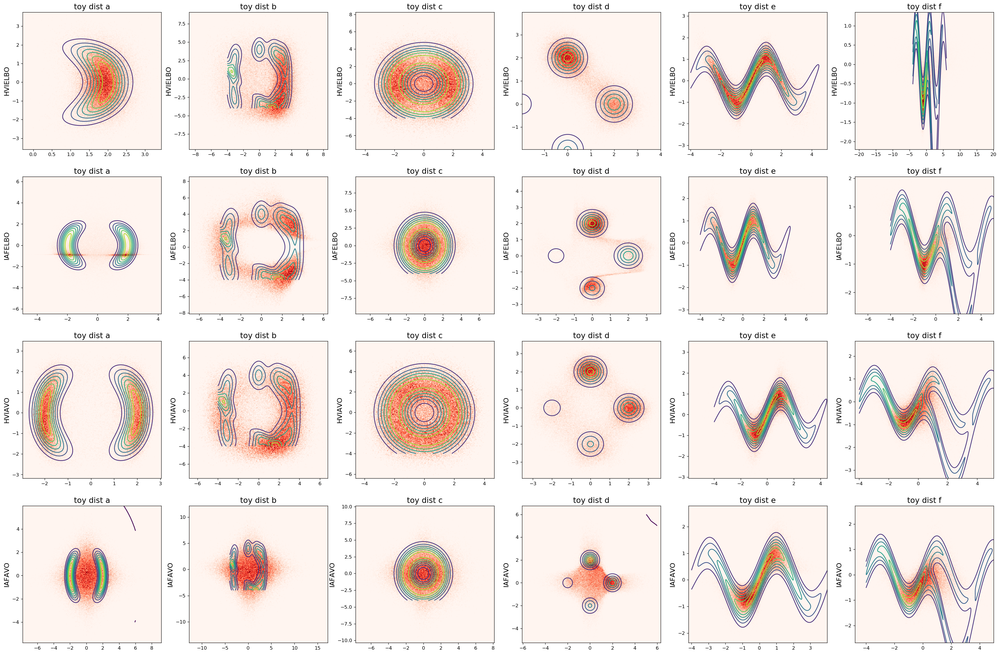

In [67]:
fig_toy, axs_toy = plot_results(models_toy, targets_toy)

In [68]:
fig_toy.savefig('toy_figs.png', transparent=True)

In [14]:
models = make_models(targets)

In [23]:
torch.save(obj=models['pickle2d&HVIELBO'].state_dict(), f='./pretrained_models/pickle2d&HVIELBO.pt')

# .save('./pretrained_models/pickle2d&HVIELBO.pt')

In [16]:
import torch

dummy_input = torch.randn(1, 2, device=device)
model = models['pickle2d&HVIELBO'].to(device)

# Providing input and output names sets the display names for values
# within the model's graph. Setting these does not change the semantics
# of the graph; it is only for readability.
#
# The inputs to the network consist of the flat list of inputs (i.e.
# the values you would pass to the forward() method) followed by the
# flat list of parameters. You can partially specify names, i.e. provide
# a list here shorter than the number of inputs to the model, and we will
# only set that subset of names, starting from the beginning.
input_names = [ "input_distribution" ]
output_names = [ "output_distribution" ]

torch.onnx.export(model, dummy_input, './pretrained_models/pickle2d&HVIELBO.onnx', verbose=True, input_names=input_names, output_names=output_names)

/home/g/miniconda3/envs/annealed/lib/python3.7/site-packages/torch/onnx/utils.py:655: UserWarning: ONNX export failed on ATen operator broadcast_tensors because torch.onnx.symbolic_opset9.broadcast_tensors does not exist
  .format(op_name, opset_version, op_name))


KeyError: 'broadcast_tensors'

In [28]:
traced = torch.jit.trace(model, dummy_input)


/home/g/miniconda3/envs/bml/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 2 element(s) (out of 2) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 1.277204155921936 (-0.5483365058898926 vs. 0.7288676500320435), which occurred at index (0, 0).
  check_tolerance, strict, _force_outplace, True, _module_class)
/home/g/miniconda3/envs/bml/lib/python3.7/site-packages/torch/jit/__init__.py:1119: TracerWarning: Output nr 2. of the traced function does not match the corresponding output of the Python function. Detailed error:
With rtol=1e-05 and atol=1e-05, found 1 element(s) (out of 1) whose difference(s) exceeded the margin of error (including 0 nan comparisons). The greatest difference was 2.707810401916504 (-0.7101991176605225 vs. 1.9976112842559814), which

In [29]:
traced.save('./pretrained_models/pickle2d&HVIELBO.pth')